In [1]:
import requests
import datetime
import time
import csv
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import randint
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
import xgboost as xgb
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from xgboost import XGBClassifier
import seaborn as sns
import pickle
import joblib

Using TensorFlow backend.


In [2]:
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [3]:
fighter1 = pd.read_csv('fighter1.csv')
fighter2 = pd.read_csv('fighter2.csv')

fighter1.drop(columns=['Unnamed: 0'], inplace=True)
fighter2.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
fighter1

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner
0,Alistair Overeem vs Roy Nelson,2015-03-14,Roy-Nelson,56.383333,991.0,806.0,22.0,23.0,0.070044,0.000000,1.704282,0.396245,1.213001,0.308447,0.005746,0.009133,0.058712,0.115217,0.000000,0.016427,0.000000,1.350594,0.227360,0.126328,1.239771,0.258435,0.206076,7,6,0.357143,13,72.0,263.0,72.0,38.0,1,0,0,1
1,Edson Barboza vs Kevin Lee,2018-04-21,Edson-Barboza,93.050000,1862.0,1869.0,35.0,44.0,0.019665,0.000000,1.584809,0.248992,1.493655,0.225384,0.004075,0.005624,0.117143,0.243007,0.008707,0.010538,0.000000,0.847731,0.341016,0.396063,1.407833,0.029559,0.147418,13,5,0.392157,18,71.0,155.0,75.0,32.0,1,0,0,1
2,Johny Hendricks vs Stephen Thompson,2016-02-06,Johny-Hendricks,80.700000,1606.0,1341.0,53.0,80.0,0.064497,0.000000,1.579997,0.291542,1.185315,0.116347,0.004438,0.006240,0.059748,0.071179,0.008851,0.023013,0.000000,1.093823,0.307067,0.179107,0.828193,0.493205,0.258599,12,3,0.704225,15,69.0,185.0,69.0,32.0,0,1,0,1
3,Jim Miller vs Danny Castillo,2015-07-25,Danny-Castillo,67.466667,823.0,752.0,39.0,62.0,0.024860,0.014822,0.994368,0.306697,0.957205,0.326799,0.006241,0.008421,0.074786,0.083529,0.032468,0.048127,0.017332,0.484676,0.180873,0.328819,0.622347,0.164534,0.207487,7,5,0.476190,12,69.0,155.0,71.0,35.0,1,0,0,1
4,Brad Tavares vs Thales Leites,2017-10-07,Thales-Leites,101.716667,1200.0,1329.0,102.0,24.0,0.015917,0.009831,0.869445,0.456280,0.974502,0.287627,0.006183,0.007738,0.050811,0.116071,0.034083,0.089994,0.001404,0.616812,0.069419,0.183214,0.539190,0.100165,0.230090,12,6,0.384615,18,73.0,185.0,78.0,36.0,1,0,0,1
5,Tony Ferguson vs Gleison Tibau,2015-02-28,Gleison-Tibau,140.633333,1806.0,1763.0,156.0,69.0,0.004399,0.000000,0.730136,0.227649,0.716796,0.198496,0.004778,0.008978,0.069253,0.216069,0.023542,0.069024,0.003809,0.546610,0.116536,0.066990,0.486431,0.119350,0.124356,16,8,0.309598,24,70.0,155.0,71.0,31.0,0,1,0,1
6,Yves Jabouin vs Felipe Arantes,2015-08-23,Yves-Jabouin,52.750000,812.0,662.0,17.0,25.0,0.002708,0.000000,1.078558,0.260254,0.803939,0.129657,0.004967,0.008022,0.115196,0.229524,0.009614,0.024374,0.017738,0.582313,0.308166,0.188078,0.826773,0.115296,0.136489,5,4,0.327869,9,67.0,135.0,68.0,36.0,1,0,0,1
7,Gray Maynard vs Nik Lentz,2018-10-06,Gray-Maynard,100.383333,1414.0,1525.0,64.0,69.0,0.088677,0.009962,1.095625,0.293181,0.662905,0.135477,0.004913,0.007102,0.093477,0.118585,0.013915,0.048386,0.004269,0.855469,0.189076,0.051080,0.590730,0.237212,0.267683,11,6,0.317460,17,69.0,155.0,70.0,39.0,1,0,0,1
8,Tatiana Suarez vs Carla Esparza,2018-09-08,Carla-Esparza,43.716667,657.0,590.0,35.0,47.0,0.000000,0.000000,1.153048,0.476364,0.759393,0.117923,0.004950,0.007642,0.076871,0.089056,0.006662,0.062850,0.003268,0.985711,0.131391,0.035946,0.545149,0.207917,0.399982,4,3,0.222222,7,61.0,115.0,63.0,30.0,0,0,0,1
9,Jose Aldo vs Max Holloway,2017-06-03,Jose-Aldo,64.200000,1279.0,1328.0,17.0,64.0,0.078478,0.000000,1.298301,0.240555,0.802383,0.103518,0.003266,0.004559,0.140523,0.093342,0.005192,0.021807,0.000000,0.990291,0.108006,0.200004,1.025714,0.030817,0.241770,8,1,0.584795,9,67.0,145.0,70.0,30.0,1,0,0,1


In [6]:
fighter2

,fight,date,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,winner
0,Alistair Overeem vs Roy Nelson,2015-03-14,Alistair-Overeem,22.516667,168.0,261.0,7.0,3.0,0.048292,0.022206,1.169837,0.464874,2.522379,1.353868,0.016247,0.006431,0.119048,0.666667,0.006345,0.006345,0.000000,0.885447,0.216821,0.067569,0.639187,0.247477,0.283172,3,3,0.649351,6,76.0,265.0,80.0,34.0,1,0,0,1
1,Edson Barboza vs Kevin Lee,2018-04-21,Kevin-Lee,65.833333,827.0,1016.0,44.0,45.0,0.000000,0.000000,0.883885,0.147262,1.225874,0.368893,0.006146,0.005955,0.065431,0.123272,0.025152,0.044842,0.000000,0.561697,0.222369,0.099819,0.636277,0.109170,0.138438,9,3,0.591716,12,69.0,170.0,77.0,25.0,1,0,0,1
2,Johny Hendricks vs Stephen Thompson,2016-02-06,Stephen-Thompson,35.866667,535.0,524.0,13.0,19.0,0.006219,0.013941,1.156838,0.158998,1.437994,0.354350,0.005278,0.006445,0.038462,0.120108,0.000000,0.003983,0.003983,0.518839,0.272295,0.365703,0.943519,0.201370,0.011949,6,1,0.299401,7,72.0,170.0,75.0,32.0,1,0,0,1
3,Jim Miller vs Danny Castillo,2015-07-25,Jim-Miller,91.600000,1379.0,1013.0,63.0,29.0,0.012972,0.000000,1.129775,0.396713,0.693205,0.201412,0.004865,0.011578,0.138473,0.265517,0.064909,0.080541,0.003119,0.718582,0.208417,0.202776,0.631183,0.207402,0.291190,13,5,0.534759,18,68.0,155.0,71.0,31.0,0,1,0,1
4,Brad Tavares vs Thales Leites,2017-10-07,Brad-Tavares,86.366667,1174.0,1118.0,45.0,65.0,0.018461,0.011579,1.014435,0.263646,0.849236,0.146427,0.005841,0.007274,0.093704,0.148816,0.005980,0.019213,0.004962,0.576075,0.178404,0.259956,0.660712,0.251263,0.102460,10,4,0.628931,14,73.0,185.0,74.0,29.0,1,0,0,1
5,Tony Ferguson vs Gleison Tibau,2015-02-28,Tony-Ferguson,41.183333,771.0,646.0,6.0,22.0,0.009391,0.000000,1.130481,0.280324,0.826973,0.161306,0.003592,0.008128,0.416667,0.212879,0.030435,0.010489,0.003469,0.733841,0.190889,0.205751,1.061484,0.047953,0.021044,7,1,0.699301,8,71.0,155.0,76.0,31.0,1,0,0,1
6,Yves Jabouin vs Felipe Arantes,2015-08-23,Felipe-Arantes,38.533333,517.0,489.0,13.0,25.0,0.003707,0.000000,0.826463,0.174372,0.817439,0.277643,0.004943,0.006641,0.112179,0.092000,0.007415,0.033226,0.018467,0.503922,0.237271,0.085269,0.559742,0.140880,0.125841,3,3,0.675676,6,68.0,135.0,73.0,27.0,1,0,0,1
7,Gray Maynard vs Nik Lentz,2018-10-06,Nik-Lentz,109.683333,1392.0,1399.0,66.0,153.0,0.005484,0.000000,1.167376,0.237968,1.143597,0.216191,0.007020,0.006076,0.106041,0.077417,0.029445,0.051237,0.004259,0.767369,0.253134,0.146873,0.637621,0.276917,0.252838,12,6,0.689655,18,68.0,155.0,68.0,34.0,1,0,0,1
8,Tatiana Suarez vs Carla Esparza,2018-09-08,Tatiana-Suarez,13.450000,133.0,36.0,8.0,3.0,0.000000,0.000000,1.237391,1.818702,0.212484,0.043043,0.017007,0.054516,0.225000,0.111111,0.020004,0.138078,0.000000,0.886830,0.223105,0.127456,0.136839,0.140668,0.959884,3,0,0.800000,3,65.0,115.0,66.0,27.0,0,0,0,1
9,Jose Aldo vs Max Holloway,2017-06-03,Max-Holloway,90.716667,2408.0,2159.0,16.0,84.0,0.009578,0.000000,1.869720,0.264903,1.446777,0.175281,0.002744,0.004715,0.234375,0.119907,0.007052,0.021835,0.000000,1.305720,0.394927,0.169073,1.441886,0.294687,0.133147,13,3,0.434783,16,71.0,145.0,69.0,25.0,1,0,0,1


In [23]:
real_model_df = pd.merge(fighter1, fighter2, how='outer')
real_model_df

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
0,Alistair Overeem vs Roy Nelson,2015-03-14,Roy-Nelson,56.383333,991.0,806.0,22.0,23.0,0.070044,0.000000,1.704282,0.396245,1.213001,0.308447,0.005746,0.009133,0.058712,0.115217,0.000000,0.016427,0.000000,1.350594,0.227360,0.126328,1.239771,0.258435,0.206076,7,6,0.357143,13,72.0,263.0,72.0,38.0,1,0,0,1,Alistair-Overeem,22.516667,168.0,261.0,7.0,3.0,0.048292,0.022206,1.169837,0.464874,2.522379,1.353868,0.016247,0.006431,0.119048,0.666667,0.006345,0.006345,0.000000,0.885447,0.216821,0.067569,0.639187,0.247477,0.283172,3,3,0.649351,6,76.0,265.0,80.0,34.0,1,0,0
1,Edson Barboza vs Kevin Lee,2018-04-21,Edson-Barboza,93.050000,1862.0,1869.0,35.0,44.0,0.019665,0.000000,1.584809,0.248992,1.493655,0.225384,0.004075,0.005624,0.117143,0.243007,0.008707,0.010538,0.000000,0.847731,0.341016,0.396063,1.407833,0.029559,0.147418,13,5,0.392157,18,71.0,155.0,75.0,32.0,1,0,0,1,Kevin-Lee,65.833333,827.0,1016.0,44.0,45.0,0.000000,0.000000,0.883885,0.147262,1.225874,0.368893,0.006146,0.005955,0.065431,0.123272,0.025152,0.044842,0.000000,0.561697,0.222369,0.099819,0.636277,0.109170,0.138438,9,3,0.591716,12,69.0,170.0,77.0,25.0,1,0,0
2,Johny Hendricks vs Stephen Thompson,2016-02-06,Johny-Hendricks,80.700000,1606.0,1341.0,53.0,80.0,0.064497,0.000000,1.579997,0.291542,1.185315,0.116347,0.004438,0.006240,0.059748,0.071179,0.008851,0.023013,0.000000,1.093823,0.307067,0.179107,0.828193,0.493205,0.258599,12,3,0.704225,15,69.0,185.0,69.0,32.0,0,1,0,1,Stephen-Thompson,35.866667,535.0,524.0,13.0,19.0,0.006219,0.013941,1.156838,0.158998,1.437994,0.354350,0.005278,0.006445,0.038462,0.120108,0.000000,0.003983,0.003983,0.518839,0.272295,0.365703,0.943519,0.201370,0.011949,6,1,0.299401,7,72.0,170.0,75.0,32.0,1,0,0
3,Jim Miller vs Danny Castillo,2015-07-25,Danny-Castillo,67.466667,823.0,752.0,39.0,62.0,0.024860,0.014822,0.994368,0.306697,0.957205,0.326799,0.006241,0.008421,0.074786,0.083529,0.032468,0.048127,0.017332,0.484676,0.180873,0.328819,0.622347,0.164534,0.207487,7,5,0.476190,12,69.0,155.0,71.0,35.0,1,0,0,1,Jim-Miller,91.600000,1379.0,1013.0,63.0,29.0,0.012972,0.000000,1.129775,0.396713,0.693205,0.201412,0.004865,0.011578,0.138473,0.265517,0.064909,0.080541,0.003119,0.718582,0.208417,0.202776,0.631183,0.207402,0.291190,13,5,0.534759,18,68.0,155.0,71.0,31.0,0,1,0
4,Brad Tavares vs Thales Leites,2017-10-07,Thales-Leites,101.716667,1200.0,1329.0,102.0,24.0,0.015917,0.009831,0.869445,0.456280,0.974502,0.287627,0.006183,0.007738,0.050811,0.116071,0.034083,0.089994,0.001404,0.616812,0.069419,0.183214,0.539190,0.100165,0.230090,12,6,0.384615,18,73.0,185.0,78.0,36.0,1,0,0,1,Brad-Tavares,86.366667,1174.0,1118.0,45.0,65.0,0.018461,0.011579,1.014435,0.263646,0.849236,0.146427,0.005841,0.007274,0.093704,0.148816,0.005980,0.019213,0.004962,0.576075,0.178404,0.259956,0.660712,0.251263,0.102460,10,4,0.628931,14,73.0,185.0,74.0,29.0,1,0,0
5,Tony Ferguson vs Gleison Tibau,2015-02-28,Gleison-Tibau,140.633333,1806.0,1763.0,156.0,69.0,0.004399,0.000000,0.730136,0.227649,0.716796,0.198496,0.004778,0.008978,0.069253,0.216069,0.023542,0.069024,0.003809,0.546610,0.116536,0.066990,0.486431,0.119350,0.124356,16,8,0.30959

In [24]:
real = real_model_df.sort_values(by='date')

In [25]:
len(real)

1568

In [27]:
real

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
209,Ryan Bader vs Rogerio Nogueira,2010-09-25,Rogerio-Nogueira,8.933333,78.0,81.0,13.0,1.0,0.057900,0.000000,1.098449,0.609994,0.541504,0.167022,0.011026,0.017808,0.017751,0.000000,0.047974,0.079957,0.031983,0.892765,0.031983,0.173700,0.922542,0.079957,0.095949,2,0,0.273973,2,74.0,205.0,75.0,34.0,0,1,0,1,Ryan-Bader,20.466667,314.0,253.0,20.0,0.0,0.046930,0.000000,1.189196,0.509609,0.498189,0.080115,0.005444,0.012539,0.089881,NaN,0.013960,0.100233,0.000000,0.830279,0.115079,0.243838,0.712250,0.159144,0.317802,4,0,0.769231,4,74.0,205.0,74.0,27.0,1,0,0
30,Dan Henderson vs Mauricio Rua,2011-11-19,Mauricio-Rua,36.900000,508.0,431.0,24.0,13.0,0.034539,0.000000,1.488039,0.593249,0.770765,0.160208,0.008463,0.010470,0.121528,0.094017,0.008212,0.042712,0.000000,0.923142,0.261113,0.303784,0.745308,0.283863,0.458868,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0,1,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0
31,Dan Henderson vs Mauricio Rua,2011-11-19,Mauricio-Rua,36.900000,508.0,431.0,24.0,13.0,0.034539,0.000000,1.488039,0.593249,0.770765,0.160208,0.008463,0.010470,0.121528,0.094017,0.008212,0.042712,0.000000,0.923142,0.261113,0.303784,0.745308,0.283863,0.458868,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0,1,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0
32,Dan Henderson vs Mauricio Rua,2011-11-19,Mauricio-Rua,36.900000,508.0,431.0,24.0,13.0,0.034539,0.000000,1.488039,0.593249,0.770765,0.160208,0.008463,0.010470,0.121528,0.094017,0.008212,0.042712,0.000000,0.923142,0.261113,0.303784,0.745308,0.283863,0.458868,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0,1,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0
33,Dan Henderson vs Mauricio Rua,2011-11-19,Mauricio-Rua,36.900000,508.0,431.0,24.0,13.0,0.034539,0.000000,1.488039,0.593249,0.770765,0.160208,0.008463,0.010470,0.121528,0.094017,0.008212,0.042712,0.000000,0.923142,0.261113,0.303784,0.745308,0.283863,0.458868,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0,1,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0
1548,Renan Barao vs Urijah Faber,2012-07-21,Urijah-Faber,18.450000,341.0,377.0,17.0,16.0,0.022123,0.000000,1.476934,0.421644,0.914772,0.129301,0.003900,0.006036,0.081283,0.084936,0.022123,0.044245,0.022123,1.151239,0.231551,0.094144,0.778718,0.152892,0.545324,2,1,0.246914,3,66.0,135.0,67.0,33.0,1,0,0,2,Renan

In [28]:
real[10:]

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1107,Bryan Caraway vs Johnny Bedford,2013-04-27,Johnny-Bedford,5.966667,89.0,155.0,3.0,6.0,0.167598,0.000000,3.102671,1.436844,3.799822,2.310220,0.008692,0.007404,0.333333,0.055556,0.000000,0.083799,0.000000,2.389324,0.335196,0.378151,1.425285,0.420403,1.256983,2,0,0.523560,2,70.0,135.0,71.0,30.0,1,0,0,2,Bryan-Caraway,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0
147,Roy Nelson vs Cheick Kongo,2013-04-27,Cheick-Kongo,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,1,Roy-Nelson,32.716667,635.0,399.0,8.0,17.0,0.105803,0.000000,2.115989,0.481302,1.202177,0.233459,0.006005,0.011538,0.125000,0.073529,0.000000,0.020668,0.000000,1.633077,0.359080,0.123832,1.443897,0.336220,0.335872,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
146,Jon Jones vs Chael Sonnen,2013-04-27,Chael-Sonnen,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0,1,Jon-Jones,59.650000,939.0,673.0,30.0,22.0,0.009779,0.000000,1.541516,0.505503,0.839194,0.242203,0.006650,0.011419,0.214444,0.378788,0.029245,0.071314,0.000000,0.869142,0.320013,0.352360,0.767227,0.238722,0.535567,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0
532,Michael Bisping vs Alan Belcher,2013-04-27,Alan-Belcher,67.116667,689.0,883.0,14.0,47.0,0.010150,0.000000,1.048896,0.324575,1.157549,0.415793,0.007723,0.008540,0.260204,0.130733,0.036897,0.021842,0.002128,0.669179,0.128152,0.251566,0.682603,0.217053,0.149240,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0,1,Michael-Bisping,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0
1336,Cody McKenzie vs Leonard Garcia,2013-04-27,Leonard-Garcia,52.350000,1162.0,1443.0,11.0,22.0,0.002729,0.000000,1.435287,0.721779,1.098403,0.176125,0.003110,0.003658,0.142857,0.135281,0.015290,0.044787,0.016936,1.060195,0.290189,0.084903,1.169095,0.058234,0.207958,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0,2,Cody-McKenzie,16.016667,138.0,138.0,3.0,12.0,0.000000,0.000000,0.745647,0.220418,1.482906,1.018825,0.008149,0.021224,0.666667,0.064815,0.164509,0.098560,0.081161,0.370464,0.136707,0.238475,0.561489,0.033749,0.150409,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1
688,Phil Davis vs Vinny Magalhaes,2013-04-27,Vinny-Magalhaes,11.533333,181.0,213.0,5.0,3.0,0.000000,0.000000,0.882517,0.136364,1.692821,0.599923,0.005774,0.006771,0.233333,0.222222,0.000000,0.037159,0.000000,0.414283,0.392251,0.075983,0.538100,0.155293,0.189125,1,2,0.281690,3,75.0,205.0,79.0

In [29]:
###getting rid of first 10 because they should not be there - don't have gambling odds on that - not sure why it's there

In [30]:
real = real[10:]

In [31]:
len(real)

1558

In [32]:
real.to_csv('realmodeldf.csv')

In [33]:
bloop = real.drop(['fight', 'date', 'fighter_1', 'fighter_2'], axis=1)
bloop.columns

Index(['cumultime_1', 'cumulStr_Att_fighter_1', 'cumulStr_Att_oponent_1',
       'cumulTD_Att_fighter_1', 'cumulTD_Att_oponent_1', 'KDPM_1',
       'KDPM_ratio_1', 'SLPM_1', 'SLPM_ratio_1', 'SAPM_1', 'SAPM_ratio_1',
       'Str_Acc_1', 'Str_Def_1', 'TD_Acc_1', 'TD_Def_1', 'SubPM_1', 'PassPM_1',
       'RevPM_1', 'Head_SLPM_1', 'Body_SLPM_1', 'Leg_SLPM_1', 'Dist_SLPM_1',
       'Clinch_SLPM_1', 'Ground_SLPM_1', 'wins_1', 'losses_1',
       'implied_prob_1', 'prev_1', 'height_1', 'weight_1', 'reach_1', 'age_1',
       'stance_Orthodox_1', 'stance_Southpaw_1', 'stance_Switch_1', 'winner',
       'cumultime_2', 'cumulStr_Att_fighter_2', 'cumulStr_Att_oponent_2',
       'cumulTD_Att_fighter_2', 'cumulTD_Att_oponent_2', 'KDPM_2',
       'KDPM_ratio_2', 'SLPM_2', 'SLPM_ratio_2', 'SAPM_2', 'SAPM_ratio_2',
       'Str_Acc_2', 'Str_Def_2', 'TD_Acc_2', 'TD_Def_2', 'SubPM_2', 'PassPM_2',
       'RevPM_2', 'Head_SLPM_2', 'Body_SLPM_2', 'Leg_SLPM_2', 'Dist_SLPM_2',
       'Clinch_SLPM_2', 'Ground_SL

In [34]:
bloop

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1107,5.966667,89.0,155.0,3.0,6.0,0.167598,0.000000,3.102671,1.436844,3.799822,2.310220,0.008692,0.007404,0.333333,0.055556,0.000000,0.083799,0.000000,2.389324,0.335196,0.378151,1.425285,0.420403,1.256983,2,0,0.523560,2,70.0,135.0,71.0,30.0,1,0,0,2,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0
147,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,1,32.716667,635.0,399.0,8.0,17.0,0.105803,0.000000,2.115989,0.481302,1.202177,0.233459,0.006005,0.011538,0.125000,0.073529,0.000000,0.020668,0.000000,1.633077,0.359080,0.123832,1.443897,0.336220,0.335872,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
146,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0,1,59.650000,939.0,673.0,30.0,22.0,0.009779,0.000000,1.541516,0.505503,0.839194,0.242203,0.006650,0.011419,0.214444,0.378788,0.029245,0.071314,0.000000,0.869142,0.320013,0.352360,0.767227,0.238722,0.535567,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0
532,67.116667,689.0,883.0,14.0,47.0,0.010150,0.000000,1.048896,0.324575,1.157549,0.415793,0.007723,0.008540,0.260204,0.130733,0.036897,0.021842,0.002128,0.669179,0.128152,0.251566,0.682603,0.217053,0.149240,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0,1,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0
1336,52.350000,1162.0,1443.0,11.0,22.0,0.002729,0.000000,1.435287,0.721779,1.098403,0.176125,0.003110,0.003658,0.142857,0.135281,0.015290,0.044787,0.016936,1.060195,0.290189,0.084903,1.169095,0.058234,0.207958,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0,2,16.016667,138.0,138.0,3.0,12.0,0.000000,0.000000,0.745647,0.220418,1.482906,1.018825,0.008149,0.021224,0.666667,0.064815,0.164509,0.098560,0.081161,0.370464,0.136707,0.238475,0.561489,0.033749,0.150409,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1
688,11.533333,181.0,213.0,5.0,3.0,0.000000,0.000000,0.882517,0.136364,1.692821,0.599923,0.005774,0.006771,0.233333,0.222222,0.000000,0.037159,0.000000,0.414283,0.392251,0.075983,0.538100,0.155293,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,1,44.316667,539.0,383.0,39.0,13.0,0.000000,0.000000,0.733896,0.787983,0.500354,0.706087,0.004443,0.011265,0.081261,0.100000,0.022976,0.091768,0.000000,0.321167,0.296803,0.115926,0.259911,0.128241,0.345743,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
842,12.600000,215.0,216.0,9.0,9.0,0.000000,0.000000,0.569728,0.068792,1.369048,0.399079,0.002209,0.004306,0.018519,0.166667,0.000000,0.011338,0.000000,0.368481,0.05102

In [35]:
bloop.fillna(0, inplace=True)
bloop.to_csv('needs_to_be_standardized_for_model.csv')
B = bloop.copy()
for col in B.columns:
    B[col] = (B[col]-min(B[col])) / (max(B[col]) - min(B[col])) #subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1107,0.015760,0.020434,0.046347,0.017341,0.033898,0.115600,0.000000,0.265572,0.351770,0.345863,0.517510,0.069183,0.022483,0.333333,0.055556,0.000000,0.094331,0.000000,0.259194,0.153741,0.233718,0.188969,0.091913,0.154327,0.086957,0.000000,0.520160,0.000000,0.409091,0.133333,0.845238,0.384615,1.0,0.0,0.0,1.0,0.067329,0.043293,0.069696,0.123711,0.044304,0.000000,0.000000,0.079733,0.032618,0.163684,0.100730,0.085150,0.045961,0.062500,0.400000,0.070564,0.319977,0.000000,0.083049,0.036138,0.053553,0.135480,0.023867,0.017682,0.090909,0.076923,0.447978,0.034483,0.347826,0.133333,0.333333,0.32,1.0,0.0,0.0
147,0.451917,0.220434,0.131983,0.208092,0.322034,0.010104,0.036041,0.107825,0.205194,0.025435,0.023808,0.087300,0.076071,0.201389,0.097076,0.009883,0.030178,0.012694,0.067712,0.160467,0.210614,0.058043,0.103825,0.049373,0.478261,0.333333,0.273761,0.466667,0.681818,0.833333,0.976190,0.653846,1.0,0.0,0.0,0.0,0.172286,0.162284,0.119435,0.041237,0.107595,0.081453,0.000000,0.225255,0.126966,0.142849,0.069938,0.088100,0.083391,0.125000,0.073529,0.000000,0.035124,0.000000,0.235104,0.117899,0.047028,0.283160,0.080450,0.076881,0.227273,0.230769,0.718269,0.206897,0.521739,0.986667,0.500000,0.64,1.0,0.0,0.0
146,0.310078,0.211750,0.128913,0.358382,0.062147,0.000000,0.000000,0.095473,0.169481,0.021035,0.017019,0.044317,0.050353,0.088707,0.310606,0.011397,0.103252,0.005908,0.081884,0.091009,0.136946,0.048381,0.039980,0.076986,0.260870,0.266667,0.038652,0.266667,0.545455,0.600000,0.880952,0.615385,0.0,1.0,0.0,0.0,0.334437,0.243028,0.203562,0.154639,0.139241,0.007528,0.000000,0.158277,0.133784,0.096247,0.072719,0.100503,0.082392,0.214444,0.378788,0.049852,0.121196,0.000000,0.120809,0.105072,0.133816,0.150460,0.057121,0.122591,0.500000,0.076923,0.932549,0.344828,0.695652,0.600000,1.000000,0.20,1.0,0.0,0.0
532,0.384059,0.173691,0.269797,0.080925,0.265537,0.007001,0.000000,0.084362,0.079463,0.089299,0.093141,0.060376,0.027061,0.260204,0.130733,0.066694,0.024588,0.004942,0.072593,0.058778,0.155481,0.090502,0.047454,0.018323,0.391304,0.333333,0.168367,0.400000,0.590909,0.466667,0.869048,0.346154,1.0,0.0,0.0,0.0,0.563215,0.565471,0.492478,0.293814,0.405063,0.007308,0.000000,0.169679,0.231392,0.098554,0.032831,0.038618,0.049931,0.117630,0.113814,0.016575,0.050660,0.013504,0.174459,0.083034,0.060263,0.207456,0.063368,0.072473,0.590909,0.384615,0.646297,0.551724,0.565217,0.466667,0.625000,0.56,1.0,0.0,0.0
1336,0.295121,0.294508,0.441682,0.063584,0.124294,0.001882,0.000000,0.118454,0.176707,0.083556,0.039454,0.018451,0.007389,0.142857,0.135281,0.027638,0.050416,0.039319,0.115010,0.133099,0.052475,0.155002,0.012732,0.025532,0.086957,0.400000,0.671968,0.200000,0.409091,0.200000,0.821429,0.500000,1.0,0.0,0.0,1.0,0.071744,0.030279,0.039300,0.015464,0.075949,0.000000,0.000000,0.065487,0.053471,0.178890,0.319675,0.129300,0.165252,0.666667,0.064815,0.280430,0.167498,0.177698,0.046200,0.044886,0.090566,0.110113,0.008075,0.034429,0.090909,0.230769,0.305067,0.103448,0.521739,0.266667,0.500000,0.20,0.0,0.0,1.0
688,0.049287,0.043934,0.064150,0.028902,0.016949,0.000000,0.000000,0.069682,0.033385,0.141274,0.134388,0.042666,0.019932,0.233

In [36]:
B['win'] = B['winner']
B.drop(columns=['winner'], inplace=True)
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,win
1107,0.015760,0.020434,0.046347,0.017341,0.033898,0.115600,0.000000,0.265572,0.351770,0.345863,0.517510,0.069183,0.022483,0.333333,0.055556,0.000000,0.094331,0.000000,0.259194,0.153741,0.233718,0.188969,0.091913,0.154327,0.086957,0.000000,0.520160,0.000000,0.409091,0.133333,0.845238,0.384615,1.0,0.0,0.0,0.067329,0.043293,0.069696,0.123711,0.044304,0.000000,0.000000,0.079733,0.032618,0.163684,0.100730,0.085150,0.045961,0.062500,0.400000,0.070564,0.319977,0.000000,0.083049,0.036138,0.053553,0.135480,0.023867,0.017682,0.090909,0.076923,0.447978,0.034483,0.347826,0.133333,0.333333,0.32,1.0,0.0,0.0,1.0
147,0.451917,0.220434,0.131983,0.208092,0.322034,0.010104,0.036041,0.107825,0.205194,0.025435,0.023808,0.087300,0.076071,0.201389,0.097076,0.009883,0.030178,0.012694,0.067712,0.160467,0.210614,0.058043,0.103825,0.049373,0.478261,0.333333,0.273761,0.466667,0.681818,0.833333,0.976190,0.653846,1.0,0.0,0.0,0.172286,0.162284,0.119435,0.041237,0.107595,0.081453,0.000000,0.225255,0.126966,0.142849,0.069938,0.088100,0.083391,0.125000,0.073529,0.000000,0.035124,0.000000,0.235104,0.117899,0.047028,0.283160,0.080450,0.076881,0.227273,0.230769,0.718269,0.206897,0.521739,0.986667,0.500000,0.64,1.0,0.0,0.0,0.0
146,0.310078,0.211750,0.128913,0.358382,0.062147,0.000000,0.000000,0.095473,0.169481,0.021035,0.017019,0.044317,0.050353,0.088707,0.310606,0.011397,0.103252,0.005908,0.081884,0.091009,0.136946,0.048381,0.039980,0.076986,0.260870,0.266667,0.038652,0.266667,0.545455,0.600000,0.880952,0.615385,0.0,1.0,0.0,0.334437,0.243028,0.203562,0.154639,0.139241,0.007528,0.000000,0.158277,0.133784,0.096247,0.072719,0.100503,0.082392,0.214444,0.378788,0.049852,0.121196,0.000000,0.120809,0.105072,0.133816,0.150460,0.057121,0.122591,0.500000,0.076923,0.932549,0.344828,0.695652,0.600000,1.000000,0.20,1.0,0.0,0.0,0.0
532,0.384059,0.173691,0.269797,0.080925,0.265537,0.007001,0.000000,0.084362,0.079463,0.089299,0.093141,0.060376,0.027061,0.260204,0.130733,0.066694,0.024588,0.004942,0.072593,0.058778,0.155481,0.090502,0.047454,0.018323,0.391304,0.333333,0.168367,0.400000,0.590909,0.466667,0.869048,0.346154,1.0,0.0,0.0,0.563215,0.565471,0.492478,0.293814,0.405063,0.007308,0.000000,0.169679,0.231392,0.098554,0.032831,0.038618,0.049931,0.117630,0.113814,0.016575,0.050660,0.013504,0.174459,0.083034,0.060263,0.207456,0.063368,0.072473,0.590909,0.384615,0.646297,0.551724,0.565217,0.466667,0.625000,0.56,1.0,0.0,0.0,0.0
1336,0.295121,0.294508,0.441682,0.063584,0.124294,0.001882,0.000000,0.118454,0.176707,0.083556,0.039454,0.018451,0.007389,0.142857,0.135281,0.027638,0.050416,0.039319,0.115010,0.133099,0.052475,0.155002,0.012732,0.025532,0.086957,0.400000,0.671968,0.200000,0.409091,0.200000,0.821429,0.500000,1.0,0.0,0.0,0.071744,0.030279,0.039300,0.015464,0.075949,0.000000,0.000000,0.065487,0.053471,0.178890,0.319675,0.129300,0.165252,0.666667,0.064815,0.280430,0.167498,0.177698,0.046200,0.044886,0.090566,0.110113,0.008075,0.034429,0.090909,0.230769,0.305067,0.103448,0.521739,0.266667,0.500000,0.20,0.0,0.0,1.0,1.0
688,0.049287,0.043934,0.064150,0.028902,0.016949,0.000000,0.000000,0.069682,0.033385,0.141274,0.134388,0.042666,0.019932,0.233333

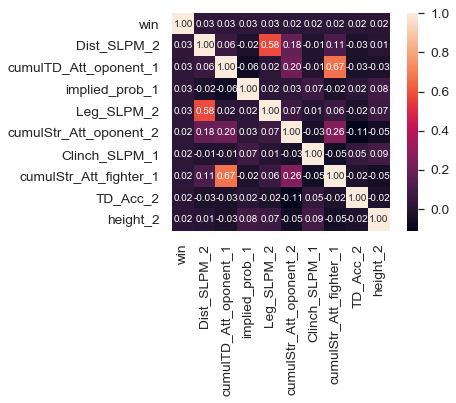

In [37]:
# Subset Correlation Matrix
n = 10 #number of variables for heatmap
corrmat = B.corr()
cols = corrmat.nlargest(n, 'win')['win'].index
cm = np.corrcoef(B[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [18]:
train_set, test_set= np.split(B, [int(.8 *len(B))])

In [19]:
len(train_set)

1254

In [20]:
len(test_set)

314

In [21]:
X_train = train_set.iloc[:, 0:-1]
y_train = train_set.loc[:, 'win']
X_test = test_set.iloc[:, 0:-1]
y_test = test_set.loc[:, 'win']

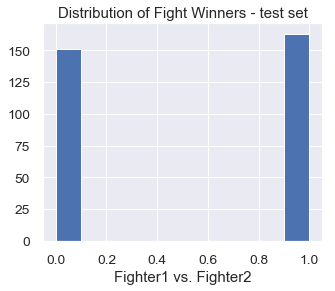

In [22]:
y_test.hist(figsize=(5,4))
plt.title('Distribution of Fight Winners - test set')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Winners.png')

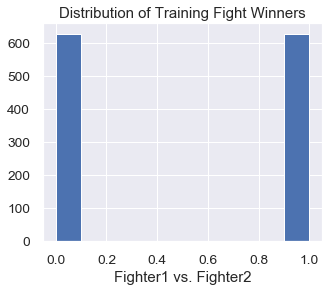

In [23]:
y_train.hist(figsize=(5,4))
plt.title('Distribution of Training Fight Winners')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Train_Winners.png')

In [24]:
#print metrics function
def print_metrics(test, preds):
    print("Precision Score: {}".format(precision_score(test, preds)))
    print("Recall Score: {}".format(recall_score(test, preds)))
    print("Accuracy Score: {}".format(accuracy_score(test, preds)))
    print("F1 Score: {}".format(f1_score(test, preds)))

#function to look at importance of features
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(20,20))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

# Dummy Classifier

In [25]:
# Fitting and training the dummy
dummy = DummyClassifier(strategy='stratified', random_state=20)
dummy.fit(X_train, y_train)

# Dummy predictions
dum_pred = dummy.predict(X_test)

#Printing out results
print_metrics(y_test, dum_pred)

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, dum_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.514792899408284
Recall Score: 0.5337423312883436
Accuracy Score: 0.4968152866242038
F1 Score: 0.5240963855421688

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,69,82,151
1.0,76,87,163
All,145,169,314


# Logistic Regression

In [26]:
#logistic regression
logreg = LogisticRegression(fit_intercept = False, C = 1e16, random_state=0)
model_log = logreg.fit(X_train, y_train)
model_log

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1e+16, class_weight=None, dual=False, fit_intercept=False,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [27]:
y_pred = logreg.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5428571428571428
Recall Score: 0.5828220858895705
Accuracy Score: 0.5286624203821656
F1 Score: 0.5621301775147929

AUC is :0.53

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,71,80,151
1.0,68,95,163
All,139,175,314


Test AUC: 0.6730716253443526
train AUC: 0.7556726058871981


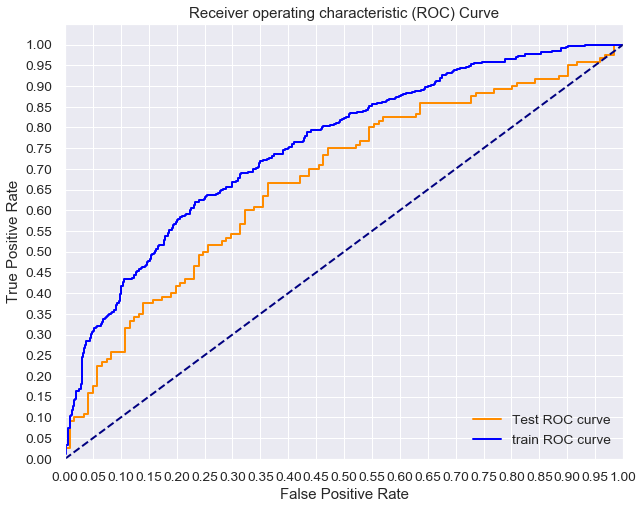

In [746]:
y_test_score = model_log.decision_function(X_test)
y_train_score = model_log.decision_function(X_train)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)

print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
print('train AUC: {}'.format(auc(train_fpr, train_tpr)))

plt.figure(figsize=(10,8))
lw = 2
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')
plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='train ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#  Random Forest

In [31]:
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=20, verbose=0,
                       warm_start=False)

In [32]:
y_pred = forest.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5321100917431193
Recall Score: 0.3558282208588957
Accuracy Score: 0.5031847133757962
F1 Score: 0.4264705882352941

AUC is :0.51

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,100,51,151
1.0,105,58,163
All,205,109,314


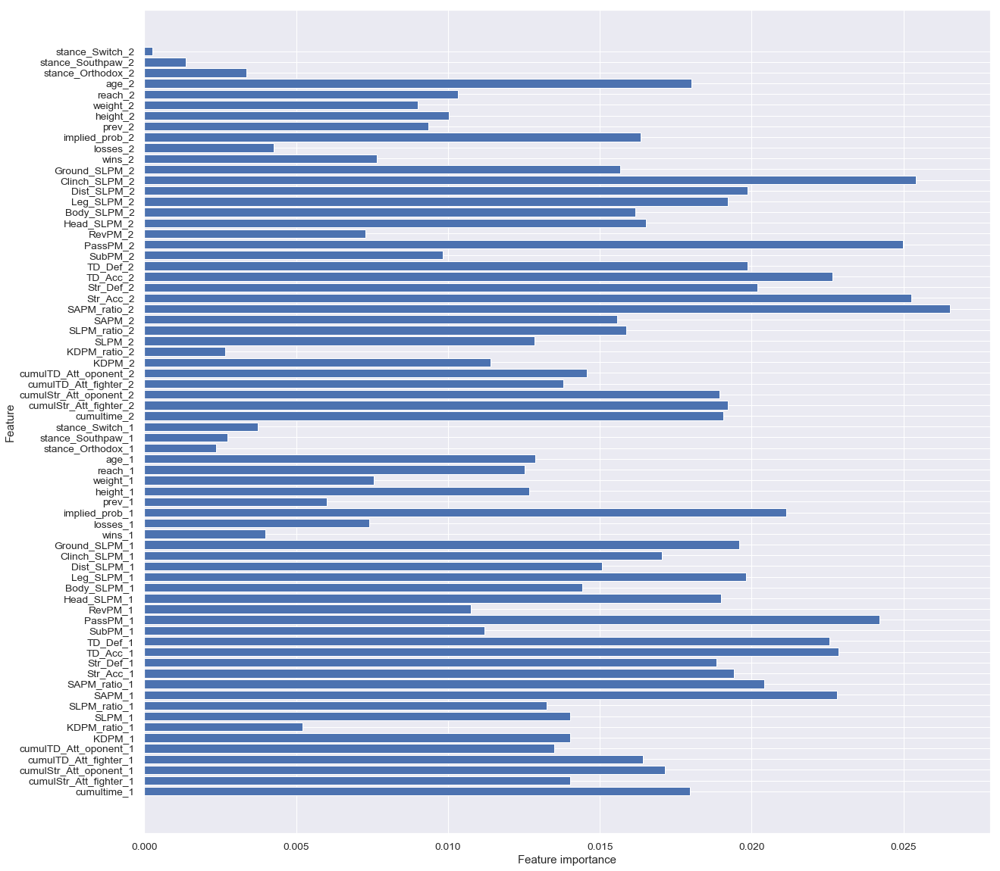

In [33]:
plot_feature_importances(forest)

### Grid Search on RF

In [752]:
##first running randomized search

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


KeyboardInterrupt: 

In [ ]:
##running randomized search 2nd time

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

In [ ]:
##running randomized search third time

param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': randint(10, 100)
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

In [591]:
#creating grid for grid search for random forest

rf_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 5, 10, 15, 20],
    'max_features': [None, 2, 10, 15, 20, 30],
    'min_samples_split': [2, 10, 50, 75, 100, 125],
    'min_samples_leaf': [25, 50, 100, 150, 200],
    'n_estimators': [10, 50, 100, 150],
}


rf_grid_search = GridSearchCV(forest, rf_param_grid, cv=3, return_train_score=True, verbose=3)
rf_grid_search.fit(X, y)

Fitting 3 folds for each of 8640 candidates, totalling 25920 fits
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.808, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.766, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.827, test=0.658), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.816, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.803, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.842, test=0.665), total=   1.3s
[

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.839, test=0.656), total=   1.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.814, test=0.624), total=   1.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.810, test=0.613), total=   1.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.765, test=0.661), total

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.752, test=0.658), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.768, test=0.658), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.761, test=0.663), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.733, test=0.600), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.767, test=0.613), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.725, test=0.661), total

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.739, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.663), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.673, test=0.663), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.604), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.674), tot

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.667), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.696, test=0.649), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.673, test=0.663), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.686, test=0.604), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.672), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.646, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.643, test=0.672), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.646, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.640, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.641, test=0.65

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.822, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.810, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.834, test=0.577), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.830, test=0.577), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.725, test=0.579), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.779, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.773, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.784, test=0.602), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.749, test=0.575), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.695, test=0.584), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.690, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.678, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.693, test=0.575), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.708, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.787, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.793, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.801, test=0.658), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.804, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.792, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.744, test=0.633), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.734, test=0.620), total=   0.2s

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.717, test=0.615), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.727, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.710, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.624), total=   0.1s

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.627), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.654, test=0.627), total=   

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.636), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.615, test=0.561), total=   0

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.791, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.803, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.790, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.794, test=0.624), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.798, test=0.613), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.741, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.631), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.750, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.757, test=0.658), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.744, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.751, test=0.624), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.723, test=0.640), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.734, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.722, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.627), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.674, test=0.629), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.697, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.686, test=0.667), total=   0

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s


[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.649, test=0.645), tota

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.801, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.776, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.750, test=0.597), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.786, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.645), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.784, test=0.611), total=   0.4s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.724, test=0.636), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.756, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.736, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.727, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.751, test=0.633), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.717, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.733, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.706, test=0.638), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.697, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.672), total=   0

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.611), total=

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.671, test=0.615), total= 

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.805, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.819, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.800, test=0.633), total=   0.5s
[CV] c

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.773, test=0.615), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.788, test=0.624), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.740, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.741, test=0.627), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.741, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s
[CV] criterio

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.710, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.747, test=0.640), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.721, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.731, test=0.615), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.743, test=0.615), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[C

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.699, test=0.636), tota

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.660, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.652, test=0.633), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.674), total=   0

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s


[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.600), total=   1.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.679, test=0.624), total=   1.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.632, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.674, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.633, test=0.654), total=   0.8s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.597), total=   0.9s
[CV] c

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.624), total=   1.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.684, test=0.627), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.656), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.673, test=0.597), total=   0.5s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.597), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.624), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.627, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.656), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.600), total=   0.9s
[CV] c

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.673, test=0.600), total=   1.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.631), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.627, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s


[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s
[CV] c

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.640, test=0.656), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.644, test=0.658), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.640, test=0.656), total=   0.

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.690, test=0.534), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.698, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.690, test=0.536), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.708, test=0.552), total=   0.1s
[CV] criterion=gini, max_depth=2

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.682, test=0.543), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.702, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.693, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.693, test=0.557), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.600), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.674, test=0.557), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=2, ma

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.570), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.559), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.641, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.639, test=0.595), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.644, test=0.579), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.536), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.666, test=0.588), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.644, test=0.579), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.658, test=0.536), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.665, test=0.577), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.583, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.716, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.705, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.675, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.715, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=2, 

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.708, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.657, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.699, test=0.613), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.681, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.691, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.682, test=0.649), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.704, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.696, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.697, test=0.615), total=   0.1s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.707, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.688, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.676, test=0.624), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.680, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.702, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.684, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.667), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.693, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.693, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.680, test=0.663), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.702, test=0.622), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.654, test=0.627), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.691, test=0.606), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.649), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.675, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=2, 

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.699, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.693, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.665, test=0.658), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.687, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.682, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.663, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.624), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.662, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.678, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.689, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.673, test=0.656), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.666, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.627), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.680, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.679, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.669, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.692, test=0.606), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.650, test=0.622), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.646, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.673, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.656, test=0.649), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.680, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.682, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.647, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.609), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.675, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.676), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.693, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.690, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.675, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.649, test=0.658), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.669, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.654, test=0.670), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.674, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.661, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.689, test=0.613), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.654, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.606), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.660, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.678, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=2

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.663, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.665), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.673, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.682, test=0.620), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.647), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.669, test=0.638), total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.649, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.658), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.648, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.662, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.650, test=0.656), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.675, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.615), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.666, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.652, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.633), total=   0.4s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.660, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.652, test=0.633), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.674), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.639, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.649, test=0.652), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.637, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.784, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.735, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.783, test=0.652), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.785, test=0.615), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.611), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.611), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.663), total=   1.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.604), total=   1.4s
[CV

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.731, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.624), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.618), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.757, test=0.658), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.732, test=0.597), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.759, test=0.602), total=   1.2s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.663), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.686, test=0.604), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] 

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.643, test=0.672), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.646, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.632, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] cri

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.630, test=0.667), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.731, test=0.602), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.783, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.799, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.784, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.798, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.753, test=0.570), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.774, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.765, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.774, test=0.588), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.742, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.794, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.744, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.744, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.760, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.741, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.741, test=0.584), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.690, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.678, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.708, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.768, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.768, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.751, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.776, test=0.654), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.704, test=0.647), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.730, test=0.613), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.739, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.733, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.730, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.745, test=0.674), total=   0.3s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.725, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.712, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.733, test=0.629), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.732, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.690, test=0.595), total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.709, test=0.647), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.693, test=0.667), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.627), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.661), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.770, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.761, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.761, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.761, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.756, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.741, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.764, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.658), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.731, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.738, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.699, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.713, test=0.620), total=   0.0s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.726, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.730, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.722, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.740, test=0.629), total=   0.2s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.719, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.725, test=0.606), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.732, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.725, test=0.661), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.649, test=0.645), total=   0.2s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.647), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.735, test=0.672), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.743, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.741, test=0.588), total=   0.0s
[CV] criterion=gini, max_depth=5, 

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.756, test=0.656), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.758, test=0.633), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.760, test=0.613), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.759, test=0.654), total=   0.7s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.735, test=0.654), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.631), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.724, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.732, test=0.652), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.721, test=0.627), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.750, test=0.622), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.721, test=0.636), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.721, test=0.633), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.749, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.734, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.726, test=0.631), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.633), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.663, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.676, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.683, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.706, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.661, test=0.656), total=   0.2s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.641, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.641, test=0.649), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.782, test=0.649), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.765, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.767, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.771, test=0.649), total=   0.5s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.736, test=0.627), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.615), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.687, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.716, test=0.645), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.755, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.739, test=0.656), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.735, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.748, test=0.618), total=   0.8s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.730, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.740, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.739, test=0.656), total=   0.5s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.679), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.679, test=0.600), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.699, test=0.636), total=   0.6s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.652, test=0.633), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.633, test=0.674), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.649, test=0.652), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.637, test=0.658), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.810, test=0.613), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.771, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.808, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.766, test=0.620), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.777, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.808, test=0.665), total=   1.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.786, test=0.613), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.597), total=   2.0s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.613), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.725, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.732, test=0.622), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.758, test=0.663), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.731, test=0.611), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.764, test=0.624), total=   0.8s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.767, test=0.613), total=   1.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.706, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.730, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.715, test=0.633), total=   0.1s
[C

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.696, test=0.649), total=   0.

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.704, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.683, test=0.652), total=   0

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.643), total=   0.4s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.636), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.646, test=0.636), total=   0.1s
[C

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.646, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.672), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.673, test=0.600), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.646, test=0.643), tota

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.644, test=0.658), total=   0.0s
[C

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.640, test=0.656), tota

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.735, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.729, test=0.577), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.818, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.800, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.801, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.819, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.809, test=0.604), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.745, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=1

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.766, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.739, test=0.563), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.742, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.756, test=0.575), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.697, test=0.590), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.683, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.635, test=0.557), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.594, test=0.588), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.618, test=0.543), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.580, test=0.545), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.793, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.658), total=   0.5s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.792, test=0.627), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.800, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.744, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.760, test=0.647), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.734, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.751, test=0.624), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.741, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.727, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.747, test=0.672), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.745, test=0.674), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.638), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.702, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.700, test=0.661), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.693, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.654, test=0.627), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.674, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.665, test=0.627), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.661), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.803, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.782, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.791, test=0.638), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.802, test=0.654), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.765, test=0.631), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.734, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.739, test=0.658), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.722, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.744, test=0.627), total=   0.3s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.732, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.721, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.730, test=0.661), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.723, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.697, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.690, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.801, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.774, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.750, test=0.597), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.766, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.762, test=0.661), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.613), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.624), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.724, test=0.636), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.736, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.727, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.633), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.732, test=0.663), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.663, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.663, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] cri

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.787, test=0.618), total=   0.1s
[CV] criterion=gini

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.821, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.800, test=0.633), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.805, test=0.615), total=   0.5s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.773, test=0.606), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.726, test=0.620), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.721, test=0.613), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.755, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.739, test=0.658), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.741, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.665, test=0.681), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.665, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.665, test=0.681), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.683, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.660, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.816, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.803, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.842, test=0.665), total=   1.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.814, test=0.629), total=   1.1s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.814, test=0.624), total=   1.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.810, test=0.613), total=   1.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.765, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.778, test=0.611), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.768, test=0.658), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.747, test=0.606), total=   0.8s

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.733, test=0.600), total=   1.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.767, test=0.613), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.725, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.663), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.731, test=0.611), total=   1.3s

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.645), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.704, test=0.584), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.704, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.667), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.690, test=0.604), total=   0.6s

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.686, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, test=0.645), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.672, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.602), total= 

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.640, test=0.656), total=   0.

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.644, test=0.658), total=   0

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.822, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.810, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.834, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=1

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.725, test=0.579), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.773, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.784, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.794, test=0.658), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.773, test=0.588), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.765, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.730, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.749, test=0.590), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.708, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.566), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.583, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.580, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.787, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.793, test=0.640), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.801, test=0.658), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.792, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.744, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.760, test=0.647), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.748, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.734, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.751, test=0.624), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.727, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.718, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.700, test=0.609), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.700, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.704, test=0.624), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.654, test=0.627), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.798, test=0.613), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.770, test=0.652), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.764, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.764, test=0.624), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.661), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.762, test=0.631), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.786, test=0.665), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.732, test=0.665), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.721, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.722, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.735, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.729, test=0.661), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.739, test=0.627), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.674, test=0.629), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.697, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.686, test=0.667), total=   0.3s
[CV

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.645), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.801, test=0.624), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.776, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.766, test=0.631), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.750, test=0.597), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.766, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.762, test=0.661), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.613), total=   0.4s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.624), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.724, test=0.636), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.736, test=0.667), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.727, test=0.636), total=   1.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.633), total=   1.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.732, test=0.663), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.697, test=0.640), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.672), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.641, test=0.649), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.624), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.814, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.658), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.800, test=0.633), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.805, test=0.615), total=   0.5s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.783, test=0.661), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.787, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.785, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.795, test=0.649), total=   0.5s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.757, test=0.663), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.730, test=0.627), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.710, test=0.640), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.755, test=0.622), total=   0.4s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.693, test=0.652), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.721, test=0.647), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.712, test=0.649), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.687, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.679), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.600), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.699, test=0.636), total=   0.4s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.674), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.660, test=0.640), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.639, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.816, test=0.618), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.803, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.842, test=0.665), total=   1.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.814, test=0.629), total=   1.1s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.779, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.788, test=0.602), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.738, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.749, test=0.586), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.742, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.755, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.758, test=0.663), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.731, test=0.611), total=   0.8s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.733, test=0.600), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.767, test=0.613), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.725, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.749, test=0.602), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.724, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.742, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.665), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.719, test=0.597), total=   0.7s

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.686, test=0.604), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.645), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.676, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.704, test=0.584), total=   0.1s


[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.704, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.689, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.667), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.690, test=0.604), total=

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.653, test=0.679), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.646, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.673, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.646, test=0.643), total=   0.

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.644, test=0.658), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.654), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.631, test=0.665), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.640, test=0.656), total=   0.

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.641, test=0.654), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.632, test=0.665), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.602), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.644, test=0.658), total=   

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.822, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.819, test=0.649), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.810, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.834, test=0.577), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.715, test=0.620), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.700, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.732, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.778, test=0.631), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.779, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.747, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.785, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.745, test=0.593), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.683, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.570), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.583, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.635, test=0.557), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.614, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.572, test=0.525), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.528, test=0.527), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.550, test=0.514), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.792, test=0.627), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.799, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.748, test=0.654), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.758, test=0.629), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.750, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.756, test=0.615), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.732, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.742, test=0.613), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.708, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.615), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.735, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.735, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.745, test=0.674), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.624), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.710, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.604), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.704, test=0.624), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.624), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.643, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.627), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.674, test=0.638), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.676, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.687, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.665, test=0.627), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.633), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.636), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.665, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.770, test=0.652), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.764, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.764, test=0.624), total=   0.0s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.803, test=0.656), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.790, test=0.622), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.794, test=0.624), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.807, test=0.658), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.740, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.750, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.757, test=0.658), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.722, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.748, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.696, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.716, test=0.629), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.736, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.734, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.722, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.627), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.698, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.658, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.700, test=0.633), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.674, test=0.629), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.665), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.695, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.697, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.686, test=0.667), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.678, test=0.606), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.615), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.611), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.647), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.649, test=0.645), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.801, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.776, test=0.663), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.766, test=0.631), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.750, test=0.597), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.672), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.775, test=0.645), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.784, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.786, test=0.658), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.731, test=0.652), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.747, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.756, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.736, test=0.667), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.723, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.624), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.724, test=0.645), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.721, test=0.624), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.718, test=0.661), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.721, test=0.620), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.622), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.697, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.611), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.663), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.679, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.697, test=0.640), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.672), total=   0.5s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.662, test=0.645), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.658, test=0.654), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.658, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.666, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.639, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.665, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.799, test=0.636), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.809, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.781, test=0.656), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.787, test=0.618), total=   0.1s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.762, test=0.633), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.649), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.620), total=   0.4s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.741, test=0.624), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.759, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.710, test=0.640), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.747, test=0.640), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.755, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.663), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.622), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.755, test=0.622), total=   0.4s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.749, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.687, test=0.652), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.679), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.679, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.699, test=0.636), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.701, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.665, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.675, test=0.672), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.645), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.674), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.653, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.637, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.600), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.656), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.670, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.635, test=0.661), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.656), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.793, test=0.602), total

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.839, test=0.661), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.826, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.846, 

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.602), total=   1.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.793, test=0.656), total=   2.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.771, test=0.611), total=   2.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.740, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.665), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, te

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.672), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.615), total=   1.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.764, test=0.618), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.606), total=   1.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.681, 

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.680, test=0.670), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(trai

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.600), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.638), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, sco

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.644, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, 

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.658), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.833, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.845, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.811, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.825, test=0.590), tot

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.766, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.786, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.794, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.786, test=0.586),

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.581), total=   0

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.788, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.590), tota

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.755, test=0.563), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.557), total=  

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.568

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.704, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.645, test=0.5

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.56

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.584, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.580, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.583, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), tot

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.53

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.760, test=0.606), total= 

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.798, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.795, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.800, test=0.624

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.768, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.724, test=0

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.756, test=0.670), t

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.734, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.748, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.738, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.747, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.615),

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.697, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.631), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.649, test

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.683

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.680, test=0.586), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.626, test=0.57

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.655, tes

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.680, test=0.586), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.773, test=0.636), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.627)

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.794, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.804, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.808, test=0.636),

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.663), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.773, test=0.627), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.721, test

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.735, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.718, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.744, test=0.656), t

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.747, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.733, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.696, test=0.606),

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.704, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.661, test

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.696

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.678, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.681

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.630, test=0.58

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.646, tes

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.768, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.768, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.753, test=0.609), total=

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.809, test=0.661), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.807, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.807, test=0.611

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.624), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.602), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.736, test=0

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.742, test=0.672), t

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.757, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.652), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.638), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.62

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.667), t

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.692, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, te

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, 

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.657, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, te

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.66

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, tes

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.759, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), tot

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.609), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.773, test=0.609), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.654), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, te

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.750, test=0.667), t

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.769, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.665), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.631), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.667, test=0.681), t

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.701, test=0.638), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.679), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, te

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.667, 

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.643), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.674), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, te

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.636, test=0.674), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.635, 

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.639, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.65

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.632, test=

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.632, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.680, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.654), total=  

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.633, test=0.654), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.673, test=0.597), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.676, test=0.622), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.632, test=0.658)

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.680, test=0.622), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.633, test=0.656), total=  

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.635, test=0.654), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.661, test=0.627), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.632, test=0.658), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.652, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.635, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.649, test=0.631), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.646, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.636, test=0.658), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.674, test=0.600), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.62

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.635, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.635, test=0.

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.644, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.674, test=0.600), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.645, test=0.63

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.644, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.648, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.643, test=0.656), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.632, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.687, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.577), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.689, test=0.538), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.708, test=0.548), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.724, test=0.561), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.627, test=0.586), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.629, test=0.577), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.561), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.545), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.680, test=0.552), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.698, test=0.572), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.710, test=0.557), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.641, test=0.606), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.638, test=0.595), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.663, test=0.559), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.644, test=0.529), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.658, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.550), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.688, test=0.552), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.613, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.623, test=0.561), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.626, test=0.561), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.644, test=0.529), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.646, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.658, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.550), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.636, test=0.561), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.691, test=0.615), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.690, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.708, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.706, test=0.611), total=   0.1s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.705, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.658), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.705, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.706, test=0.629), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.699, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.698, test=0.624), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.693, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.706, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.669, test=0.643), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.688, test=0.604), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.698, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.692, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.698, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.697, test=0.633), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.701, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.654), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.684, test=0.615), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.700, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.696, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.679, test=0.663), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.700, test=0.622), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.701, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.631), total=   0.0s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.609), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.631), total= 

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.655, test=0.640), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.615, test=0.561), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.690, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.691, test=0.624), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.663, test=0.645), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.622), total=   0.3s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.692, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.690, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.655, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.692, test=0.620), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.689, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.691, test=0.620), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.662, test=0.577), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.681, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.669, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.684, test=0.627), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.682, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.671, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.611), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.624), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.687, test=0.627), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.682, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.681, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.663, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.693, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.681, test=0.611), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.678, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.681, test=0.611), total=

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.654, test=0.652), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.597), total=

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.613), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.650, test=0.649), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.684, test=0.654), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.680, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.649, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.676, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.686, test=0.618), total=   0.3s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.674), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.698, test=0.654), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.688, test=0.629), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.680, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.661), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.615), total=   0.3s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.686, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.667, test=0.672), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.701, test=0.643), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.678, test=0.622), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.665), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.656, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.672), total=  

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.652), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.604), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.615), total=   0.0s
[

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.667, test=0.597), total=   0.1s

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.671, test=0.615), total= 

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.670, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.644, test=0.658), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.673, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.618), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.684, test=0.613), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.647, test=0.654), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.627), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.678, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.676, test=0.615), total=   0.3s
[CV] criter

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.613), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.648, test=0.647), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.656, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.675, test=0.624), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.647, test=0.652), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.678, test=0.615), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.675, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.654), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.654), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.646, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.675, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.683, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.641, test=0.672), tot

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.636, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.674), total=   0.2s
[

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.664, test=0.658), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.640, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.636, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.609), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.791, test=0.620), total=   2.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.765, test=0.618), total=   2.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.743, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.779, test=0.615), total= 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.735, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.769, test=0.654), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.758, test=0.613),

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.609), total=   1.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.758, test=0.618), total=   1.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.721, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.611), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.758, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.757, test=0.627), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.667), total=   1.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.750, test=0.611), total=

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.738, test=0.656), total=   1.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.732, test=0.597), total=   1.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.609), total=   1.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.670), 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.690, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.680, test=0.670), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.695, test=0.645), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.675, test=0.665), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.600), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, te

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.670), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.645, test=0.63

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.665), total=  

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.643, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.632, test=0.665)

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, test=0.

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.824, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.791, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.787, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.724, test=0.600), total=   0.0s
[CV] criteri

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.782, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.777, test=0.649), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.767, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.777, test=0.600), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.748, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.696, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.688, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.692, test=0.577), total=   0.0s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.742, test=0.586), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.784, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.744, test=0.588), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.584), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.751, test=0.561), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.581), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.568), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.704, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.624, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.584, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.580, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.583, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.766, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.769, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.766, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.779, test=0.652), total=   0.3s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.769, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.775, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.766, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.712, test=0.658), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.747, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.729, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.750, test=0.672), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.745, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.731, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.743, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.712, test=0.647), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.733, test=0.663), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.726, test=0.631), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.718, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.665), total=   0.2s
[

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.700, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.697, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.709, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.649, test=0.629), total=   

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.609), total=   0.1s

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.631), total= 

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.655, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.687, test=0.661), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.655, test=0.640), tota

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.769, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.730, test=0.633), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.738, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.748, test=0.624), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.750, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.760, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.753, test=0.652), total=   0.5s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.730, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.715, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.733, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.741, test=0.661), total=   0.3s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.745, test=0.658), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.732, test=0.631), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.750, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.707, test=0.667), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.709, test=0.658), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.734, test=0.624), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.727, test=0.663), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.618), total=   0.0

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.658), total=  

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.678, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.681, test=0.611), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.678, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.566), total= 

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.770, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.776, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.751, test=0.649), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.765, test=0.636), total=   0.5s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.627), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.755, test=0.606), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.732, test=0.663), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.735, test=0.627), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.755, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.741, test=0.672), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.741, test=0.638), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.756, test=0.627), total=   0.4s
[CV] criter

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.757, test=0.622), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.716, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.721, test=0.633), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.718, test=0.654), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.595), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.717, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.735, test=0.624), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.618), total=   0.

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.683, test=0.643), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.606), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.692, test=0.629), tota

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.652), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.669, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.638), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.647, test=0.672), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.652, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.646, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.770, test=0.631), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.769, test=0.622), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.727, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.769, test=0.611), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.760, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.649), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.615), total=   0.6s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.738, test=0.627), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.757, test=0.615), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.693, test=0.649), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.736, test=0.643), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.743, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.751, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.745, test=0.658), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.615), total=   0.7s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.735, test=0.627), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.749, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.600), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.695, test=0.647), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.667, test=0.681), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.689, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.701, test=0.638), total=   0.

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.709, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.670, test=0.600), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.675, test=0.667), total=   

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.674), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.670, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.658, test=0.643), total=   0.

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.661, test=0.645), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.656, test=0.633), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.639, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.5s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.633, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.658), total

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.839, test=0.661), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.826, test=0.629), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.615), total=   1.0s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.846, test=0.661), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.602), total=   2.0s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.793, test=0.656), total=   2.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.771, test=0.611), total=   2.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.767, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.740, test=0.652), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.665), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.620), tot

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.672), total=   1.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.615), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.764, test=0.618), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.66

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.606), total=   2.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.681, test=0.656), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.680, test=0.670), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.706, test=

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.600), total=   1.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.638), total=   1.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.67

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.648, test=0.631), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.644, test=0.667), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.600), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, 

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.845, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.812, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.821, test=0.579), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.757, test=0.624), total=   0.0s
[CV] 

[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.786, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.794, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.786, test=0.586), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_fea

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.581), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.788, test=0.633), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.590), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.755, test=0.563), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.696, test=0.595), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.595), total=  

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.548), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.636, test=0.561), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.611, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.624, test=0.545), tota

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.550, test=0.489), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.535, test=0.520), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.555, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.567, test=0.523), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.771, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.760, test=0.606), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.795, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.814, test=0.661), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.795, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.801, test=0.629), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.661), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.724, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.730, test=0.613), total=   

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.756, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.736, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.734, test=0.629), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.747, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.709, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.684, test=0.611), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.708, test=0.640), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.631), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.602), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.690, test=0.595), total=   

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.708, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.66

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.609), total=

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.636, test=0.631), 

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.655, test=0.640), tota

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.615, test=0.561), tot

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.801, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.808, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.808, test=0.624), total=   0.4s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.807, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.757, test=0.647), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.755, test=0.631), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.752, test=0.618), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.756, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.740, test=0.652), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.759, test=0.633), tota

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.750, test=0.615), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.716, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.708, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.712, test=0.633), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.732, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.624), tota

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.593), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.696, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.698, test=0.638), tota

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.660, test=0.618), total=  

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.611), total=

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.678, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.660, test=0.618), 

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.647, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.614, test=0.577), tot

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.809, test=0.661), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.807, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.808, test=0.609), total=   0.5s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.809, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.744, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.761, test=0.606), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.747, test=0.627), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.752, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.624), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.604), tota

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.758, test=0.622), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.717, test=0.649), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.722, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.725, test=0.640), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.742, test=0.672), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.633), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.757, test=0.622), tota

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.683, test=0.643), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.640), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.681, test=0.606), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.692, test=0.629), tota

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.684, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.702, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.661, test=0.652), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.669, test=0.631), total=  

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.667, test=0.604), total=

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.652), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.669, test=0.631), 

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.671, test=0.615), tot

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.812, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.816, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.825, test=0.665), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.802, test=0.624), total=   0.7s
[CV] c

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.622), total=   1.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.615), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.767, test=0.658), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.767, test=0.595), total=   0.1s


[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.761, test=0.606), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.762, test=0.658), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.751, test=0.620), total=

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.740, test=0.631), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.766, test=0.618), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.715, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.750, test=0.656), total=   0.1s


[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.750, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.615), total=

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.709, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.638), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.600), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.681), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.689, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.701, test=0.638), tota

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.709, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.604), total=  

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.674), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.658, test=0.643), tota

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.658), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.656, test=0.633), to

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.639, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.633, test=0.670), tot

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.667), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.844, test=0.661), total=   2.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.620), total=   2.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.816, test=0.611), total=   2.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.769, test=0.658), tot

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.801, test=0.624), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.781, test=0.602), tot

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.615), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.758, test=0.611), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.770, test=0.658), total=   2.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.756, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.751, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.740, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.743, test=0.665), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.760, test=0.620), tot

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.672), total=   1.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.615), total=   1.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.618), total=   1.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.751, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.695, test=0.638), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.681, test=0.65

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.609), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.663), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.680, test=0.670), total=   1.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.706, test=

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.675, test=0.665), total=   2.0s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.706, test=0.600), total=   2.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.695, test=0.638), total=   1.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.640, t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.644, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.648, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.644, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.631, test=0.

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.811, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.586), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.842, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.809, test=0.613), total=   0.6s
[CV] criterio

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.811, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.825, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.730, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.723, test=0.600), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.771, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.769, test=0.584), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.777, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.776, test=0.568), total=   0.1s

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.695, test=0.581), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.747, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.788, test=0.633), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.590), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.704, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.654, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.640, test=0.570), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.702, test=0.568), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.568), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.594, test=0.588), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.618, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.600, test=0.559), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.611, test=0.554), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.624, test=0.545), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.584, test=0.536), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.580, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.586, test=0.527), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.612, test=0.545), total=  

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.583, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.567, test=0.523), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.540, test=0.541), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.557, test=0.498), total=   0.0s


[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.559, test=0.532), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.583, test=0.548), tot

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.804, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.803, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.798, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.819, test=0.663), total=   0.3s
[

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.796, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.774, test=0.633), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.779, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.733, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.756, test=0.670), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.748, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.738, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.747, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.726, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.721, test=0.624), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.715, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.745, test=0.670), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.697, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.709, test=0.631), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.683, test=0.656), total

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.704, test=0.658), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.704, test=0.615),

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.631), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.609), total=

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.671, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.638), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.572), to

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.600), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.655, test=0.640), tota

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.615, test=0.561), to

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.802, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.804, test=0.670), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.627), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.785, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.751, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.743, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.749, test=0.645), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.743, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.744, test=0.656), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.732, test=0.636), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.753, test=0.624), total=   0.3s
[CV]

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.750, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.716, test=0.665), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.708, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.712, test=0.633), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.734, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.730, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.741, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.743, test=0.627), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.671, test=0.593), total=   

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.682, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.696, test=0.606), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.698, test=0.638

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.618), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.650, test=0.622), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.681, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.666, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.672), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.671, test=0.633), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s


[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.646, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.670), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.672), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597),

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.816, test=0.627), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.809, test=0.615), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.768, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.768, test=0.622), total=   0.1s


[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.759, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.765, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.769, test=0.658), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.622), total=

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.740, test=0.638), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.758, test=0.622), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.649), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.722, test=0.627), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.742, test=0.672), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.633), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.757, test=0.622), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.618), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.698, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.683, test=0.643), total=   0.0s
[

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.671, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.606), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.692, test=0.629), tota

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.702, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.698, test=0.624), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.643), to

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.657, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), tot

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604),

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.649), tota

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.825, test=0.665), total=   0.7s
[

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.654), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.622), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.609), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.663), total

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.615), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.750, test=0.667), total=   0.6s
[

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.665), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.631), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.618), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.715, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.667, test=0.681), total=   0.3s
[

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.679), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.611), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.673, test=0.638), total

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.647), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.681), t

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.674), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.645), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.658), total

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.636, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.674), t

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.633, test=0.667), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=  

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.658), 

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.839, test=0.661), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.826, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.615), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.846, test=0.661), t

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.774, test=0.602), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.793, test=0.656), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.771, test=0.611), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.767, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.751, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.740, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.665), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.620), tot

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.672), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.753, test=0.615), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.764, test=0.618), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.66

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.606), total=   1.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.714, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.681, test=0.656), t

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.609), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.663), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.680, test=0.670), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.706, test=

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.675, test=0.665), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.706, test=0.600), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.638), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.67

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.648, test=0.631), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.644, test=0.667), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.600), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.645, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.665), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.665), t

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, test=0.667), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.643, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.665), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.672, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, 

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.845, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.811, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.825, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.757, test=0.624), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.786, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.794, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.786, test=0.586), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.807, test=0.604), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.698, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.687, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.581), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.764, test=0.643), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.747, test=0.579), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.778, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.744, test=0.595), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.686, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.548), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.702, test=0.568), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.645, test=0.557), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.686, test=0.581), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.696, test=0.595), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, test=0.577), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.568), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.594, test=0.588), total=   

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.584, test=0.536), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.580, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.586, test=0.527), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.612, test=0.545), total=   0.1s
[

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.633, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.639, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.636, test=0.561), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.594, test=0.588), total

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.559, test=0.532), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.559, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.575, test=0.525), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.555, test=0.518), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.559, test=0.532), tot

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.756, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.760, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.804, test=0.665), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.803, test=0.638), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.769, test=0.643), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.779, test=0.622), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.796, test=0.654), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.774, test=0.633), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.736, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.727, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.718, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.756, test=0.670), total=   0.2s
[CV] cri

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.748, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.738, test=0.631), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.747, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.633), total=   0.0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.721, test=0.624), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.715, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.745, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.727, test=0.624), total=

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.697, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.709, test=0.631), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.683, test=0.656), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.686, test=0.602), total= 

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.698, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.705, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.704, test=0.658), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.704, test=0.615),

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.649, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.631), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.670, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.627), tota

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.568), total=  

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.655, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.655, test=0.640), tota

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.664, test=0.645), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.626, test=0.572), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.622, test=0.568), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.615, test=0.561), to

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.804, test=0.670), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.636), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.809, test=0.667), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.768, test=0.674), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.762, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.771, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.667), total=  

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.747, test=0.656), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.733, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.750, test=0.615), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.716, test=0.665), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.735, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.718, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.743, test=0.638), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.744, test=0.656), total=   0.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.656), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.734, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.749, test=0.613), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.661, test=0.618), total= 

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.684, test=0.661), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.699, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.688, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.658), total=  

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.665), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.690, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.704, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.618)

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.613), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.656, test=0.647), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.611), total=

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.678, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.671, test=0.633), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.645), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.654, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.645), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.630, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.622, test=0.566), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.577), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.662, test=0.667), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.646, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.60

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.807, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.799, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.809, test=0.661), total=   0.6s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.654), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.624), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.667), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.734, test=0.661), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.747, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.757, test=0.638), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.742, test=0.672), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.652), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.638), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.622), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.667), total=   0.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.673, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.629), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.686, test=0.656), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.666, test=0.654), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.606), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.667), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.647, test=0.672), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.661, test=0.652), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.615), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.645), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.672), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.667, test=0.604),

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.667), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.671, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.639, test=0.652), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.670), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.667, test=0.597), total=

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.646, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.666, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.781, test=0.649), tota

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.665), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.812, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.816, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.825, test=0.665), total=   0.7s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.654), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.622), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.609), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.663), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.736, test=0.663), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.613), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.760, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.750, test=0.667), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.665), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.740, test=0.631), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.766, test=0.618), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.715, test=0.652), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.667, test=0.681), total=   0.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.679), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.691, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.709, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.673, test=0.638), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.647), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.667, test=0.681), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.674), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.661, test=0.645), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.658), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.636, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.640), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.635, test=0.674), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.636, test=0.661), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.656), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.635, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.597), total=

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.670), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.670, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.654), total=   0.3s


[Parallel(n_jobs=1)]: Done 25920 out of 25920 | elapsed: 111.8min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=10, n_jobs=None,
                                              oob_score=False,...
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini

In [592]:
rf_gs_training_score = np.mean(rf_grid_search.cv_results_['mean_train_score'])
rf_gs_testing_score = rf_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(rf_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(rf_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
rf_grid_search.best_params_

Mean Training Score: 69.08%
Mean Testing Score: 77.6%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': None,
 'max_features': 10,
 'min_samples_leaf': 25,
 'min_samples_split': 75,
 'n_estimators': 50}

In [763]:
forest2 = RandomForestClassifier(criterion='gini',
                                 max_depth=None,
                                 max_features=10,
                                 min_samples_leaf=25,
                                 min_samples_split=75,
                                 n_estimators=50,
                                random_state=0)  
forest2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=10, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=25, min_samples_split=75,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [764]:
y_pred = forest2.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6435643564356436
Recall Score: 0.5416666666666666
Accuracy Score: 0.6224066390041494
F1 Score: 0.588235294117647

AUC is :0.62

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,85,36,121
1.0,55,65,120
All,140,101,241


In [761]:
#pickling random forest
joblib.dump(forest2, './rfmodel.pkl')

['./rfmodel.pkl']

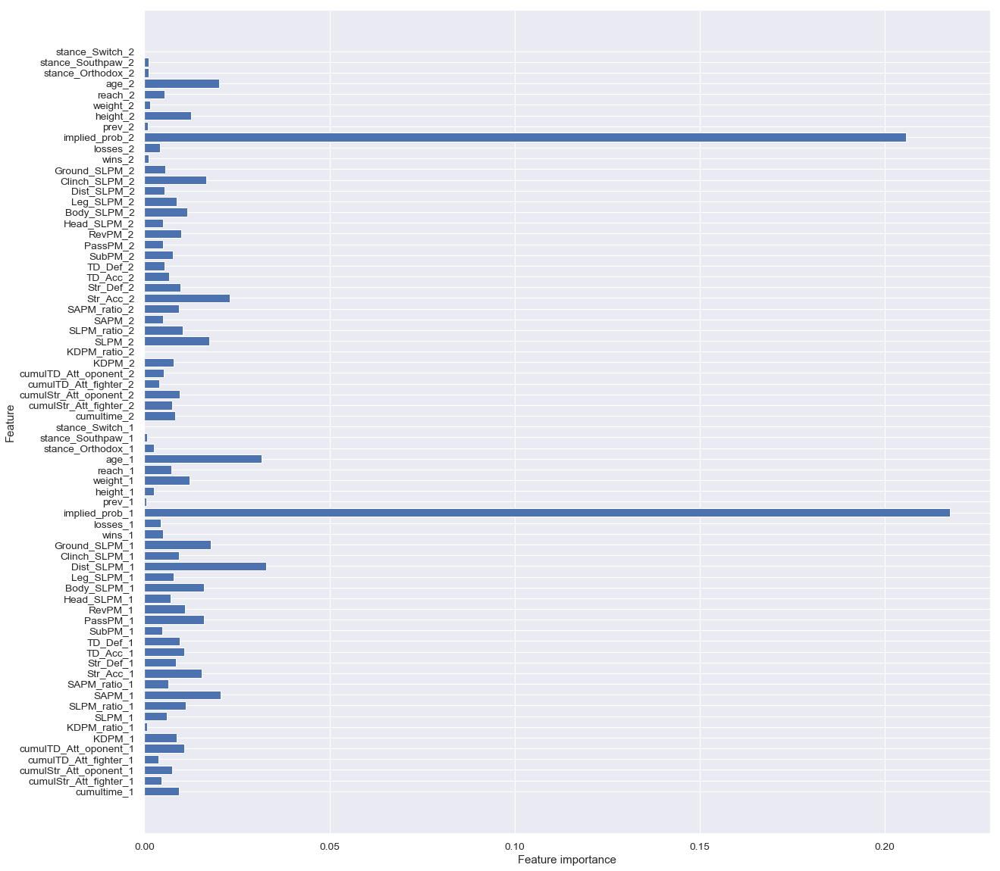

In [762]:
#importance of features
plot_feature_importances(forest2)


## Using the Random Forest Model For Gambling

In [765]:
myprobas_xtest = pd.DataFrame(forest2.predict_proba(X_test))
myprobas_xtest

,0,1
0,0.498393,0.501607
1,0.526384,0.473616
2,0.691681,0.308319
3,0.686352,0.313648
4,0.378350,0.621650
5,0.622546,0.377454
6,0.590813,0.409187
7,0.699028,0.300972
8,0.364362,0.635638
9,0.502307,0.497693


In [766]:
tested_fights = real.loc[(X_test.index)]
tested_fights = tested_fights[['date', 'fighter_1', 'implied_prob_1', 'fighter_2', 'implied_prob_2', 'winner']]
tested_fights

,date,fighter_1,implied_prob_1,fighter_2,implied_prob_2,winner
1028,2018-12-01,Mark-Hunt,0.454545,Justin-Willis,0.505051,2
1260,2018-12-01,Ben-Nguyen,0.564972,Wilson-Reis,0.434783,2
715,2018-12-01,Tyson-Pedro,0.826446,Mauricio-Rua,0.188324,2
307,2018-12-01,Christos-Giagos,0.763359,Mizuto-Hirota,0.238663,1
796,2018-12-08,Joanna-Jedrzejczyk,0.273973,Valentina-Shevchenko,0.746269,2
657,2018-12-08,Thiago-Santos,0.649351,Jimi-Manuwa,0.363636,1
424,2018-12-08,Aleksandar-Rakic,0.833333,Devin-Clark,0.180180,1
733,2018-12-08,Claudia-Gadelha,0.735294,Nina-Ansaroff,0.270270,2
153,2018-12-08,Jessica-Eye,0.322581,Katlyn-Chookagian,0.680272,1
284,2018-12-08,Gilbert-Burns,0.434783,Olivier-Aubin-Mercier,0.546448,1


In [767]:
compare = pd.DataFrame()
compare['date'] = list(tested_fights['date'])
compare['fighter_1'] = list(tested_fights['fighter_1'])
compare['vegas_prob_1'] = list(tested_fights['implied_prob_1'])
compare['my_prob_1'] = list(myprobas_xtest[0])
compare['fighter_2'] = list(tested_fights['fighter_2'])
compare['vegas_prob_2'] = list(tested_fights['implied_prob_2'])
compare['my_prob_2'] = list(myprobas_xtest[1])
compare['winner'] = list(tested_fights['winner'])
compare = compare.sort_values(by='date')
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner
0,2018-12-01,Mark-Hunt,0.454545,0.498393,Justin-Willis,0.505051,0.501607,2
1,2018-12-01,Ben-Nguyen,0.564972,0.526384,Wilson-Reis,0.434783,0.473616,2
2,2018-12-01,Tyson-Pedro,0.826446,0.691681,Mauricio-Rua,0.188324,0.308319,2
3,2018-12-01,Christos-Giagos,0.763359,0.686352,Mizuto-Hirota,0.238663,0.313648,1
14,2018-12-08,Hakeem-Dawodu,0.636943,0.625914,Kyle-Bochniak,0.362319,0.374086,1
13,2018-12-08,Chad-Laprise,0.787402,0.703859,Dhiego-Lima,0.232558,0.296141,2
12,2018-12-08,Max-Holloway,0.500000,0.586886,Brian-Ortega,0.495050,0.413114,1
11,2018-12-08,Alex-Oliveira,0.423729,0.515331,Gunnar-Nelson,0.584795,0.484669,2
10,2018-12-08,Eryk-Anders,0.434783,0.442157,Elias-Theodorou,0.540541,0.557843,2
9,2018-12-08,Gilbert-Burns,0.434783,0.502307,Olivier-Aubin-Mercier,0.546448,0.497693,1


In [768]:
vegas_payout_1 = []
for i in list(compare['vegas_prob_1']):
    vegas_payout_1.append(1/i)
my_payout_1 = []
for i in list(compare['my_prob_1']):
    my_payout_1.append(1/i)

vegas_payout_2 = []
for i in list(compare['vegas_prob_2']):
    vegas_payout_2.append(1/i)
my_payout_2 = []
for i in list(compare['my_prob_2']):
    my_payout_2.append(1/i)
    
compare['vegas_payout_1'] = vegas_payout_1
compare['my_payout_1'] = my_payout_1

compare['vegas_payout_2'] = vegas_payout_2
compare['my_payout_2'] = my_payout_2

In [769]:
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2
0,2018-12-01,Mark-Hunt,0.454545,0.498393,Justin-Willis,0.505051,0.501607,2,2.20,2.006449,1.98,1.993592
1,2018-12-01,Ben-Nguyen,0.564972,0.526384,Wilson-Reis,0.434783,0.473616,2,1.77,1.899753,2.30,2.111416
2,2018-12-01,Tyson-Pedro,0.826446,0.691681,Mauricio-Rua,0.188324,0.308319,2,1.21,1.445752,5.31,3.243399
3,2018-12-01,Christos-Giagos,0.763359,0.686352,Mizuto-Hirota,0.238663,0.313648,1,1.31,1.456977,4.19,3.188293
14,2018-12-08,Hakeem-Dawodu,0.636943,0.625914,Kyle-Bochniak,0.362319,0.374086,1,1.57,1.597663,2.76,2.673184
13,2018-12-08,Chad-Laprise,0.787402,0.703859,Dhiego-Lima,0.232558,0.296141,2,1.27,1.420738,4.30,3.376775
12,2018-12-08,Max-Holloway,0.500000,0.586886,Brian-Ortega,0.495050,0.413114,1,2.00,1.703908,2.02,2.420641
11,2018-12-08,Alex-Oliveira,0.423729,0.515331,Gunnar-Nelson,0.584795,0.484669,2,2.36,1.940501,1.71,2.063263
10,2018-12-08,Eryk-Anders,0.434783,0.442157,Elias-Theodorou,0.540541,0.557843,2,2.30,2.261640,1.85,1.792619
9,2018-12-08,Gilbert-Burns,0.434783,0.502307,Olivier-Aubin-Mercier,0.546448,0.497693,1,2.30,1.990813,1.83,2.009272


In [770]:
mytakes_1 = compare[compare['my_payout_1'] < compare['vegas_payout_1']*.85]
len(mytakes_1)

61

In [771]:
mytakes_1['mytake'] = 1

money_1takes = []
for i in list(mytakes_1.index):
    if mytakes_1['winner'][i]==1:
        money_1takes.append(100*mytakes_1['vegas_payout_1'][i]-100)
    else:
        money_1takes.append(-100)
mytakes_1['BET_win/lose'] = money_1takes

mytakes_1

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
11,2018-12-08,Alex-Oliveira,0.423729,0.515331,Gunnar-Nelson,0.584795,0.484669,2,2.36,1.940501,1.71,2.063263,1,-100.0
4,2018-12-08,Joanna-Jedrzejczyk,0.273973,0.378350,Valentina-Shevchenko,0.746269,0.621650,2,3.65,2.643053,1.34,1.608623,1,-100.0
20,2018-12-15,Sergio-Pettis,0.403226,0.536061,Rob-Font,0.606061,0.463939,2,2.48,1.865460,1.65,2.155455,1,-100.0
19,2018-12-15,Al-Iaquinta,0.250000,0.356888,Kevin-Lee,0.751880,0.643112,1,4.00,2.801997,1.33,1.554940,1,300.0
23,2018-12-29,Douglas-Silva-de-Andrade,0.250627,0.326959,Petr-Yan,0.769231,0.673041,2,3.99,3.058491,1.30,1.485793,1,-100.0
31,2019-01-19,Rachael-Ostovich,0.392157,0.521057,Paige-VanZant,0.617284,0.478943,2,2.55,1.919175,1.62,2.087933,1,-100.0
28,2019-01-19,Belal-Muhammad,0.357143,0.447248,Geoff-Neal,0.653595,0.552752,2,2.80,2.235897,1.53,1.809129,1,-100.0
39,2019-02-09,Austin-Arnett,0.240964,0.302737,Shane-Young,0.751880,0.697263,2,4.15,3.303197,1.33,1.434179,1,-100.0
41,2019-02-09,Teruto-Ishihara,0.246914,0.381204,Kyung-Ho-Kang,0.763359,0.618796,2,4.05,2.623270,1.31,1.616041,1,-100.0
42,2019-02-09,Anderson-Silva,0.192308,0.300852,Israel-Adesanya,0.813008,0.699148,2,5.20,3.323893,1.23,1.430312,1,-100.0


In [772]:
mytakes_2 = compare[compare['my_payout_2'] < compare['vegas_payout_2']*.85]
len(mytakes_2)

43

In [773]:
mytakes_2['mytake'] = 2

money_2takes = []
for i in list(mytakes_2.index):
    if mytakes_2['winner'][i]==2:
        money_2takes.append(100*mytakes_2['vegas_payout_2'][i]-100)
    else:
        money_2takes.append(-100)

mytakes_2['BET_win/lose'] = money_2takes
mytakes_2

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/hmnathel/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
2,2018-12-01,Tyson-Pedro,0.826446,0.691681,Mauricio-Rua,0.188324,0.308319,2,1.21,1.445752,5.31,3.243399,2,431.0
3,2018-12-01,Christos-Giagos,0.763359,0.686352,Mizuto-Hirota,0.238663,0.313648,1,1.31,1.456977,4.19,3.188293,2,-100.0
13,2018-12-08,Chad-Laprise,0.787402,0.703859,Dhiego-Lima,0.232558,0.296141,2,1.27,1.420738,4.30,3.376775,2,330.0
6,2018-12-08,Aleksandar-Rakic,0.833333,0.590813,Devin-Clark,0.180180,0.409187,1,1.20,1.692583,5.55,2.443870,2,-100.0
21,2018-12-15,Jack-Hermansson,0.591716,0.502156,Gerald-Meerschaert,0.420168,0.497844,1,1.69,1.991415,2.38,2.008660,2,-100.0
25,2018-12-29,Ilir-Latifi,0.546448,0.427045,Corey-Anderson,0.465116,0.572955,2,1.83,2.341676,2.15,1.745337,2,115.0
27,2018-12-29,Curtis-Millender,0.591716,0.477874,Siyar-Bahadurzada,0.421941,0.522126,1,1.69,2.092601,2.37,1.915247,2,-100.0
30,2019-01-19,Gregor-Gillespie,0.819672,0.637103,Yancy-Medeiros,0.200000,0.362897,1,1.22,1.569605,5.00,2.755603,2,-100.0
50,2019-02-17,Cynthia-Calvillo,0.769231,0.703525,Cortney-Casey,0.243902,0.296475,1,1.30,1.421413,4.10,3.372966,2,-100.0
56,2019-02-23,Gillian-Robertson,0.617284,0.515632,Veronica-Macedo,0.389105,0.484368,1,1.62,1.939366,2.57,2.064548,2,-100.0


In [774]:
sum(money_1takes)

93.00000000000028

In [775]:
sum(money_2takes)

-487.0

In [776]:
sum(money_2takes + money_1takes)

-393.9999999999996

In [522]:
takes_df = mytakes_1.append(mytakes_2)
takes_df = takes_df.sort_values(by='date')

In [531]:
takes_df

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
69,2013-04-27,Jon-Jones,0.884956,0.779760,Chael-Sonnen,0.111111,0.220240,1,1.13,1.282446,9.00,4.540501,2,-100.0
70,2013-04-27,Michael-Bisping,0.636943,0.660387,Alan-Belcher,0.222222,0.339613,1,1.57,1.514264,4.50,2.944528,2,-100.0
257,2013-05-25,Rick-Story,0.598802,0.481330,Mike-Pyle,0.400000,0.518670,2,1.67,2.077579,2.50,1.928007,2,150.0
246,2013-07-27,Tim-Means,0.289855,0.434390,Danny-Castillo,0.666667,0.565610,2,3.45,2.302080,1.50,1.768002,1,-100.0
114,2013-07-27,Daron-Cruickshank,0.598802,0.517792,Yves-Edwards,0.363636,0.482208,1,1.67,1.931276,2.75,2.073795,2,-100.0
159,2013-11-16,Josh-Koscheck,0.434783,0.495491,Tyron-Woodley,0.512821,0.504509,2,2.30,2.018200,1.95,1.982126,1,-100.0
68,2013-11-16,Thales-Leites,0.621118,0.536760,Ed-Herman,0.369004,0.463240,1,1.61,1.863032,2.71,2.158706,2,-100.0
23,2013-12-06,Caio-Magalhaes,0.350877,0.463635,Nick-Ring,0.636943,0.536365,1,2.85,2.156869,1.57,1.864402,1,185.0
229,2013-12-06,Pat-Barry,0.628931,0.517316,Soa-Palelei,0.384615,0.482684,2,1.59,1.933053,2.60,2.071750,2,160.0
178,2014-01-25,Jeremy-Stephens,0.531915,0.469715,Darren-Elkins,0.465116,0.530285,1,1.88,2.128949,2.15,1.885780,2,-100.0


In [530]:
takes_df.describe()

,vegas_prob_1,my_prob_1,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,mytake,BET_win/lose
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000
mean,0.475636,0.496065,0.521018,0.503935,1.535484,2.703161,2.166050,2.523677,2.212035,1.458065,4.458065
std,0.213834,0.138475,0.213200,0.138475,0.500356,1.572842,0.567917,1.784421,0.866447,0.499853,173.622977
min,0.100000,0.269851,0.076982,0.207042,1.000000,1.070000,1.261100,1.110000,1.369584,1.000000,-100.000000
25%,0.285773,0.399422,0.377358,0.453983,1.000000,1.610000,1.831448,1.470000,1.665065,1.000000,-100.000000
50%,0.434783,0.468452,0.561798,0.531548,2.000000,2.300000,2.134689,1.780000,1.881299,1.000000,-100.000000
75%,0.621118,0.546017,0.680272,0.600578,2.000000,3.500000,2.503624,2.650000,2.202728,2.000000,139.000000
max,0.934579,0.792958,0.900901,0.730149,2.000000,10.000000,3.705742,12.990000,4.829948,2.000000,1199.000000


# XGBoost

In [719]:
booster = xgb.XGBClassifier(random_state=20)
booster.fit(X_train, y_train)
y_pred = booster.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6039603960396039
Recall Score: 0.5083333333333333
Accuracy Score: 0.5892116182572614
F1 Score: 0.5520361990950226

AUC is :0.59

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,81,40,121
1.0,59,61,120
All,140,101,241


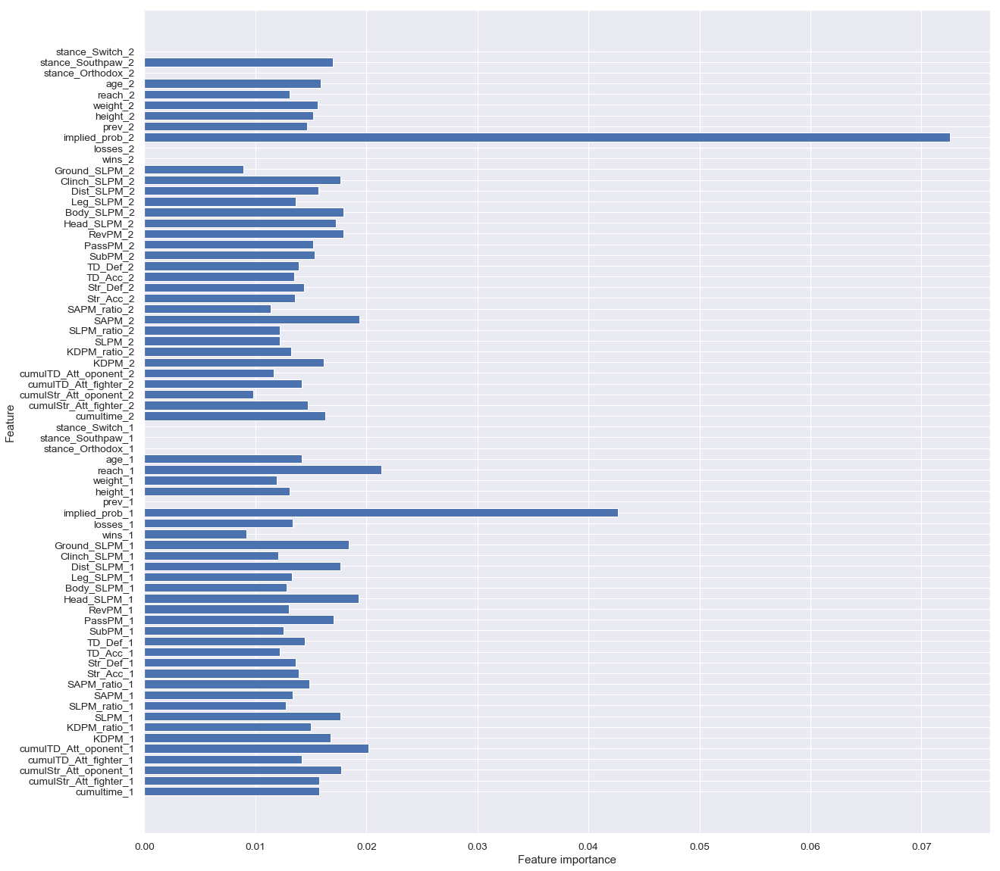

In [720]:
#importance of features
plot_feature_importances(booster)

In [186]:
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


KeyboardInterrupt: 

In [ ]:
#running randomized search again
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [ ]:
#running randomized search 3rd time
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [110]:
#creating grid for grid search for random forest
xg_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [20, 25, 30, 35, 40],
    'max_features': [20, 25, 30, 35, 40],
    'min_samples_split': [40, 50, 100, 200, 350],
    'min_samples_leaf': [40, 50, 100, 200, 350, 550],
    'n_estimators': [10, 30, 60, 100, 150, 200]
}

In [111]:
xg_grid_search = GridSearchCV(xgb.XGBClassifier(), xg_param_grid, cv=3, return_train_score=True, verbose=3)
xg_grid_search.fit(X, y)

Fitting 3 folds for each of 9000 candidates, totalling 27000 fits
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=  

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), to

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total= 

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), tota

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.1s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.6s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), to

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.61

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), 

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[Parallel(n_jobs=1)]: Done 27000 out of 27000 | elapsed: 529.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_l...
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [20, 25, 30, 35, 40],
                         'max_features': [20, 25, 30, 35, 40],
                         'min_samples_leaf': [40, 50, 100, 200, 350, 55

In [112]:
xg_gs_training_score = np.mean(xg_grid_search.cv_results_['mean_train_score'])
xg_gs_testing_score = xg_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(xg_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(xg_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
xg_grid_search.best_params_

Mean Training Score: 99.91%
Mean Testing Score: 99.7%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 20,
 'min_samples_leaf': 40,
 'min_samples_split': 40,
 'n_estimators': 10}

In [721]:
xg2 = xgb.XGBClassifier(criterion='gini',
                        max_depth=20,
                        max_features=20,
                        min_samples_leaf=40,
                        min_samples_split=40,
                        n_estimators=10,
                       randomstate=20)  
xg2.fit(X_train, y_train)
y_pred = xg2.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6055045871559633
Recall Score: 0.55
Accuracy Score: 0.5975103734439834
F1 Score: 0.5764192139737991

AUC is :0.6

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,78,43,121
1.0,54,66,120
All,132,109,241


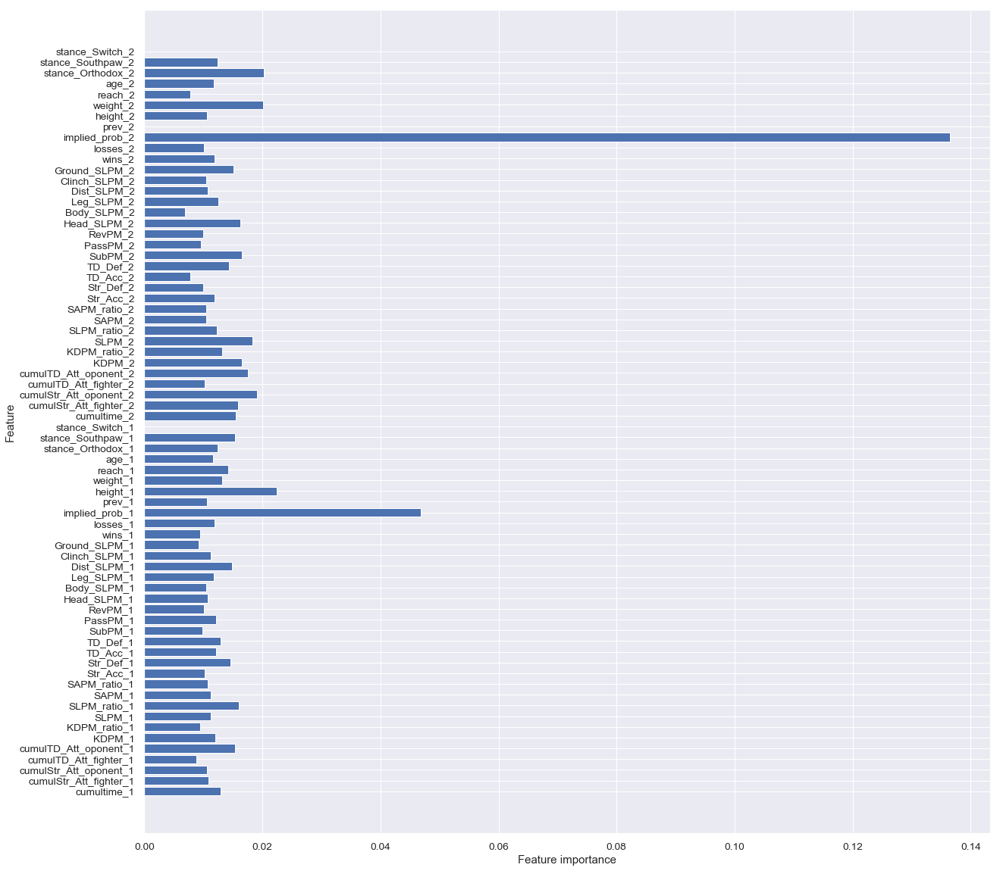

In [722]:
#importance of features
plot_feature_importances(xg2)